In [26]:
%reload_ext sql
%sql mysql://sywang@localhost/?charset=utf8mb4

In [27]:
database = 'sywang_project' ## THIS IS YOUR SUNETID
msgs_table = 'msgs'
outcomes_table = 'users'
feat_topics_table = 'feat$cat_ags_cp_w$msgs$user_id$1gra'

In [28]:
%sql use {database}

 * mysql://sywang@localhost/?charset=utf8mb4
0 rows affected.


[]

In [29]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

# General Descriptive Counts

In [5]:
%%sql 
select count(*) from msgs

 * mysql://sywang@localhost/?charset=utf8mb4
1 rows affected.


count(*)
1908


In [8]:
%%sql 
select count(*) from threads

 * mysql://sywang@localhost/?charset=utf8mb4
1 rows affected.


count(*)
542


In [9]:
%%sql 
select count(*) from users

 * mysql://sywang@localhost/?charset=utf8mb4
1 rows affected.


count(*)
398


In [10]:
%%sql 
select count(distinct feat) from feat$1gram$msgs$user_id$16to16;

 * mysql://sywang@localhost/?charset=utf8mb4
1 rows affected.


count(distinct feat)
18838


In [6]:
%%sql 
select count(distinct feat) from feat$1gram$msgs$user_id$16to16$0_02;

 * mysql://sywang@localhost/?charset=utf8mb4
1 rows affected.


count(distinct feat)
2456


In [5]:
#total number of words used by user 
%sql SELECT SUM(value) FROM feat$1gram$msgs$user_id$16to16 AS a, users AS b WHERE a.group_id = b.user_id;

 * mysql://sywang@localhost/?charset=utf8mb4
1 rows affected.


SUM(value)
349729


In [18]:
%%sql 
select count(*) from (SELECT sum(value) as wordsperuser, user_id FROM feat$1gram$msgs$user_id$16to16$0_02 AS a, 
users AS b WHERE a.group_id = b.user_id 
group by user_id) as wordcounts

 * mysql://sywang@localhost/?charset=utf8mb4
1 rows affected.


count(*)
398


In [15]:
%%sql 
select avg(wordsperuser), stddev(wordsperuser) 
from (SELECT sum(value) as wordsperuser, user_id FROM feat$1gram$msgs$user_id$16to16 AS a, 
users AS b WHERE a.group_id = b.user_id 
group by user_id) as wordcounts;

 * mysql://sywang@localhost/?charset=utf8mb4
1 rows affected.


avg(wordsperuser),stddev(wordsperuser)
878.7161,2240.463696462979


In [41]:
results = %sql SELECT sum(value) as wordsperuser, user_id FROM `feat$1gram$msgs$user_id$16to16` AS a, users AS b WHERE a.group_id = b.user_id group by user_id order by wordsperuser desc;
df=results.DataFrame()
df.head()

 * mysql://sywang@localhost/?charset=utf8mb4
398 rows affected.


,wordsperuser,user_id
0,22795,8
1,18869,45
2,17842,25
3,15109,4
4,13302,7


<BarContainer object of 398 artists>

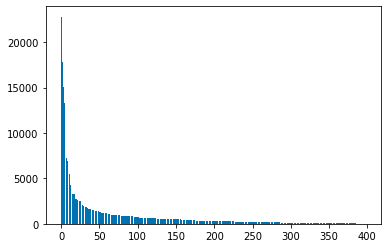

In [42]:
plt.bar(list(range(398)), df["wordsperuser"])

Text(0, 0.5, 'Number of Users')

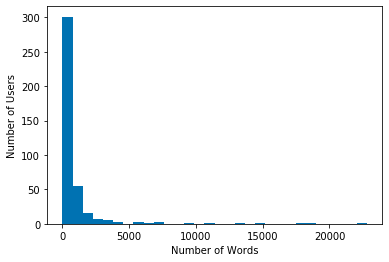

In [52]:
plt.hist(df["wordsperuser"].astype(int), bins=30)
plt.xlabel("Number of Words")
plt.ylabel("Number of Users")

In [17]:
%%sql 
SELECT count(distinct feat) FROM feat$1gram$msgs$user_id$16to16$0_02;

 * mysql://sywang@localhost/?charset=utf8mb4
1 rows affected.


count(distinct feat)
2456


In [18]:
%%sql 
select count(distinct feat) from feat$1to2gram$msgs$user_id$16to16$0_02$pmi5_0;

 * mysql://sywang@localhost/?charset=utf8mb4
1 rows affected.


count(distinct feat)
3065


In [19]:
%%sql 
select count(distinct group_id) from feat$1to2gram$msgs$user_id$16to16$0_02$pmi6_0;

 * mysql://sywang@localhost/?charset=utf8mb4
1 rows affected.


count(distinct group_id)
398


In [20]:
%%sql 
select count(distinct feat) from feat$1gram$msgs$user_id$16to16$0_02;

 * mysql://sywang@localhost/?charset=utf8mb4
1 rows affected.


count(distinct feat)
2456


In [21]:
%%sql 
select count(distinct feat) from feat$2gram$msgs$user_id$16to16$0_02$pmi5_0;

 * mysql://sywang@localhost/?charset=utf8mb4
1 rows affected.


count(distinct feat)
609


In [22]:
%%sql 
select avg(postperuser), stddev(postperuser), min(postperuser), max(postperuser) from (select count(*) as postperuser, users.user_id from msgs, users
where msgs.user_id = users.user_id
group by user_id) as postper;

 * mysql://sywang@localhost/?charset=utf8mb4
1 rows affected.


avg(postperuser),stddev(postperuser),min(postperuser),max(postperuser)
4.7940,11.313165000597726,1,117


In [31]:
result = %sql select users.user_id, count(*) as postperuser from msgs, users where msgs.user_id = users.user_id group by user_id order by postperuser desc;

 * mysql://sywang@localhost/?charset=utf8mb4
398 rows affected.


In [32]:
df=result.DataFrame()
df.head()

,user_id,postperuser
0,8,117
1,25,113
2,45,81
3,4,81
4,92,48


Text(0, 0.5, 'Number of Posts')

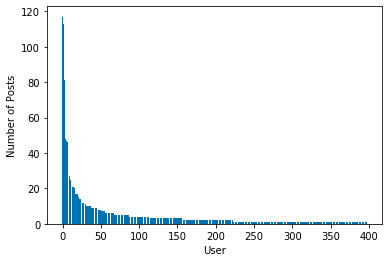

In [39]:
plt.style.use('seaborn-colorblind')
plt.bar(list(range(398)), df["postperuser"])
plt.xlabel("User")
plt.ylabel("Number of Posts")

Text(0, 0.5, 'Number of Users')

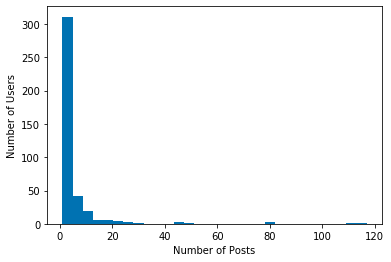

In [40]:
plt.hist(df["postperuser"], bins=30)
plt.xlabel("Number of Posts")
plt.ylabel("Number of Users")

# Gender Outcomes

## Descriptives

In [36]:
%%sql 
select count(*) as num_users, gender from users group by gender;

 * mysql://sywang@localhost/?charset=utf8mb4
2 rows affected.


num_users,gender
276,0
122,1


In [37]:
122/276

0.4420289855072464

In [38]:
%%sql 
select count(*) as num_posts, gender from users, msgs
where users.user_id = msgs.user_id
group by gender;

 * mysql://sywang@localhost/?charset=utf8mb4
2 rows affected.


num_posts,gender
1552,0
356,1


In [69]:
result = %sql select cleandate, count(*) as num_posts from msgs group by cleandate order by cleandate;  

 * mysql://sywang@localhost/?charset=utf8mb4
443 rows affected.


In [70]:
df=result.DataFrame()
df.head()

,cleandate,num_posts
0,2019-04-08,3
1,2019-04-09,9
2,2019-04-10,6
3,2019-04-11,2
4,2019-04-12,1


In [72]:
df["cleandate"]=pd.to_datetime(df["cleandate"])

In [74]:
df.set_index(["cleandate"], inplace=True)

In [77]:
resampledf=df.resample('W').sum().reset_index()

In [78]:
resampledf.head()

,cleandate,num_posts
0,2019-04-14,24
1,2019-04-21,16
2,2019-04-28,34
3,2019-05-05,35
4,2019-05-12,35


(array([737119., 737180., 737241., 737303., 737364., 737425., 737485.,
        737546., 737607., 737669., 737730.]),
 <a list of 11 Text xticklabel objects>)

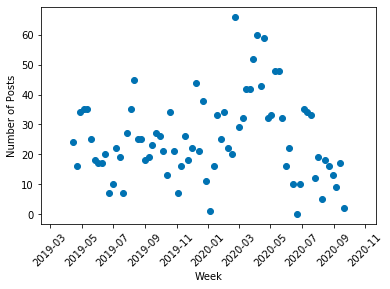

In [82]:
plt.scatter(resampledf["cleandate"], resampledf["num_posts"])
plt.xlabel("Week")
plt.ylabel("Number of Posts")
plt.xticks(rotation=45)

## Correlations

In [39]:
#gender correlations with 1-2 grams
out_d = '~/ags/gender'
out_name = '1to2grams_gender'
!rm -rf {out_d}/{out_name}*
!mkdir -p {out_d}

!dlatkInterface.py \
    --corpdb {database} \
    --corptable {msgs_table} \
    --correl_field user_id \
    --correlate --rmatrix --csv --sort \
    --feat_table 'feat$1to2gram$msgs$user_id$16to16$0_02$pmi5_0' \
    --group_freq_thresh 50 \
    --outcome_table {outcomes_table} \
    --outcomes gender \
    --tagcloud --make_wordclouds \
    --output_name {out_d}/{out_name}



/shared/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.linear_model.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.linear_model. Anything that cannot be imported from sklearn.linear_model is now part of the private API.
  warnings.warn(message, FutureWarning)
/shared/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.
  warnings.warn(message, FutureWarning)


-----
DLATK Interface Initiated: 2020-11-16 05:19:53
-----
SQL QUERY: show tables like 'feat$1to2gram$msgs$user_id$16to16$0_02$pmi5_0'


In [40]:
#gender correlations with LIWC 
out_d = '~/ags/gender'
out_name = 'LIWC_gender'
!rm -rf {out_d}/{out_name}*
!mkdir -p {out_d}

!dlatkInterface.py \
    --corpdb {database} \
    --corptable {msgs_table} \
    --correl_field user_id \
    --correlate --rmatrix --csv --sort \
    --feat_table 'feat$cat_LIWC2015$msgs$user_id$1gra' \
    --outcome_table {outcomes_table} \
    --outcomes gender \
    --group_freq_thresh 50 \
    --tagcloud --make_wordclouds \
    --output_name {out_d}/{out_name}



/shared/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.linear_model.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.linear_model. Anything that cannot be imported from sklearn.linear_model is now part of the private API.
  warnings.warn(message, FutureWarning)
/shared/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.
  warnings.warn(message, FutureWarning)


-----
DLATK Interface Initiated: 2020-11-16 05:19:57
-----
SQL QUERY: show tables like 'feat$cat_LIWC2015$msgs$user_id$1gra'
Loading Ou

In [50]:
#gender correlations with topics 
out_d = '~/ags/gender'
out_name = 'topics_gender'
!mkdir -p {out_d}
!rm -rf {out_d}/{out_name}*

!dlatkInterface.py \
    --corpdb {database} \
    --corptable {msgs_table} \
    --correl_field user_id \
    --correlate --rmatrix --csv --sort \
    --outcome_table {outcomes_table} \
    --outcomes gender \
    --group_freq_thresh 50 \
    --feat_table '{feat_topics_table}' \
    --topic_tagcloud --make_topic_wordclouds \
    --topic_lexicon 'ags_freq' \
    --lexicondb {database} \
    --tagcloud_colorscheme blue \
    --output_name {out_d}/{out_name}



/shared/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.linear_model.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.linear_model. Anything that cannot be imported from sklearn.linear_model is now part of the private API.
  warnings.warn(message, FutureWarning)
/shared/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.
  warnings.warn(message, FutureWarning)


-----
DLATK Interface Initiated: 2020-11-16 06:58:27
-----
SQL QUERY: show tables like 'feat$cat_ags_cp_w$msgs$user_id$1gra'
Loading Ou

In [42]:
#gender correlations with empathy 
out_d = '~/ags/gender'
out_name = 'empathy_gender'
!mkdir -p {out_d}
!rm -rf {out_d}/{out_name}*

!dlatkInterface.py \
    --corpdb {database} \
    --corptable {msgs_table} \
    --correl_field user_id \
    --correlate --rmatrix --csv --sort \
    --feat_table 'feat$cat_empathy_w$msgs$user_id$1gra' \
    --outcome_table {outcomes_table} \
    --outcomes gender \
    --group_freq_thresh 50 \
    --tagcloud --make_wordclouds \
    --output_name {out_d}/{out_name}



/shared/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.linear_model.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.linear_model. Anything that cannot be imported from sklearn.linear_model is now part of the private API.
  warnings.warn(message, FutureWarning)
/shared/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.
  warnings.warn(message, FutureWarning)


-----
DLATK Interface Initiated: 2020-11-16 05:20:03
-----
SQL QUERY: show tables like 'feat$cat_empathy_w$msgs$user_id$1gra'
Loading O

# State (Region) Outcomes

## Descriptives

In [9]:
%%sql 
select count(*) as num_users, state from users group by state order by num_users desc;

 * mysql://sywang@localhost/?charset=utf8mb4
48 rows affected.


num_users,state
48,CA
32,NY
29,FL
26,TX
24,INTL
16,IL
15,NC
15,MD
13,MI
13,PA


In [69]:
%%sql 
select count(*) as num_users, division from users group by division order by num_users desc;

 * mysql://sywang@localhost/?charset=utf8mb4
10 rows affected.


num_users,division
84,SouthAtlantic
67,Pacific
53,MidAtlantic
49,MidwestNorth
36,SouthWest
30,Mountain
28,NewEngland
24,INTL
18,MidwestWest
9,SouthEast


In [70]:
%%sql 
select count(*) as num_posts, division from users, msgs
where msgs.user_id = users.user_id
group by division order by num_posts desc;

 * mysql://sywang@localhost/?charset=utf8mb4
10 rows affected.


num_posts,division
482,SouthAtlantic
342,MidAtlantic
289,Pacific
237,MidwestNorth
223,NewEngland
118,Mountain
102,SouthWest
57,INTL
42,MidwestWest
16,SouthEast


In [72]:
%%sql 
select count(*) as num_users, region from users group by region order by num_users desc;

 * mysql://sywang@localhost/?charset=utf8mb4
5 rows affected.


num_users,region
129,South
97,West
81,Northeast
67,Midwest
24,INTL


In [71]:
%%sql 
select count(*) as num_posts, region from users, msgs
where msgs.user_id = users.user_id
group by region order by num_posts desc;

 * mysql://sywang@localhost/?charset=utf8mb4
5 rows affected.


num_posts,region
600,South
565,Northeast
407,West
279,Midwest
57,INTL


The state data is a little bit too sparse, so I'll go with the census region data instead
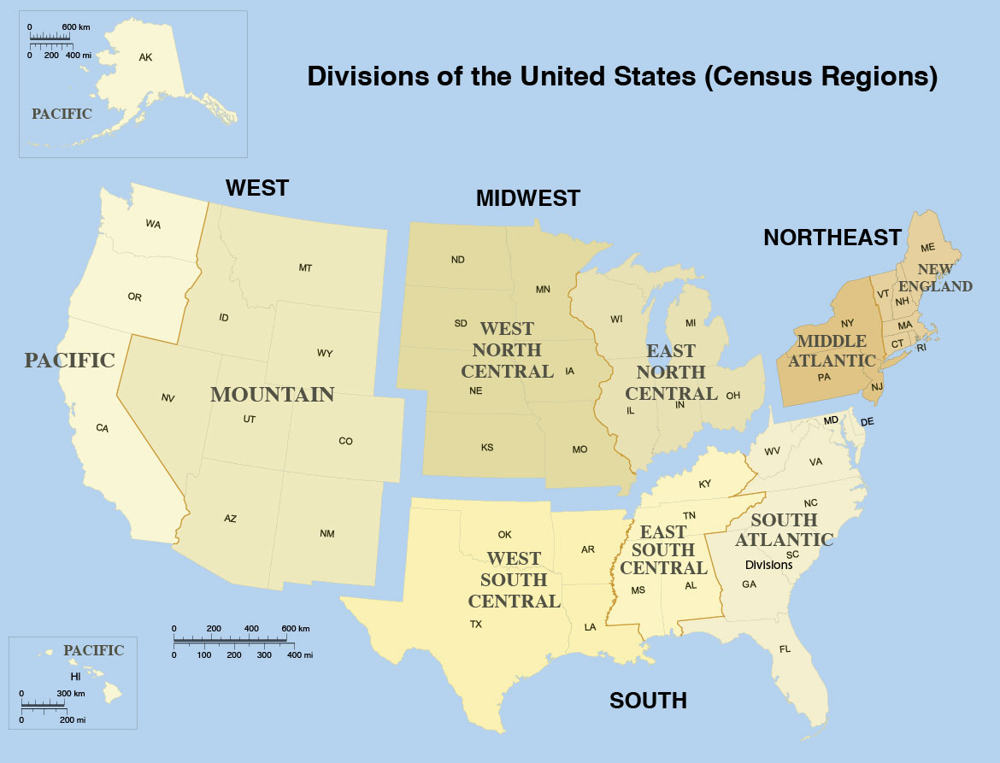

## Correlations

In [43]:
#region correlations with 1-2 grams
out_d = '~/ags/region'
out_name = '1to2grams_region'
!rm -rf {out_d}/{out_name}*
!mkdir -p {out_d}

!dlatkInterface.py \
    --corpdb {database} \
    --corptable {msgs_table} \
    --correl_field user_id \
    --correlate --rmatrix --csv --sort \
    --feat_table 'feat$1to2gram$msgs$user_id$16to16$0_02$pmi5_0'\
    --group_freq_thresh 50 \
    --outcome_table {outcomes_table} \
    --outcomes region \
    --categories_to_binary region \
    --tagcloud --make_wordclouds \
    --output_name {out_d}/{out_name}



/shared/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.linear_model.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.linear_model. Anything that cannot be imported from sklearn.linear_model is now part of the private API.
  warnings.warn(message, FutureWarning)
/shared/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.
  warnings.warn(message, FutureWarning)


-----
DLATK Interface Initiated: 2020-11-16 05:20:21
-----
SQL QUERY: show tables like 'feat$1to2gram$msgs$user_id$16to16$0_02$pmi5_0'


In [44]:
#region correlations with LIWC
out_d = '~/ags/region'
out_name = 'liwc_region'
!rm -rf {out_d}/{out_name}*
!mkdir -p {out_d}

!dlatkInterface.py \
    --corpdb {database} \
    --corptable {msgs_table} \
    --correl_field user_id \
    --correlate --rmatrix --csv --sort \
    --feat_table 'feat$cat_LIWC2015$msgs$user_id$1gra'\
    --group_freq_thresh 50 \
    --outcome_table {outcomes_table} \
    --outcomes region \
    --categories_to_binary region \
    --tagcloud --make_wordclouds \
    --output_name {out_d}/{out_name}



/shared/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.linear_model.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.linear_model. Anything that cannot be imported from sklearn.linear_model is now part of the private API.
  warnings.warn(message, FutureWarning)
/shared/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.
  warnings.warn(message, FutureWarning)


-----
DLATK Interface Initiated: 2020-11-16 05:20:35
-----
SQL QUERY: show tables like 'feat$cat_LIWC2015$msgs$user_id$1gra'
Loading Ou

In [23]:
#region correlations with topics 
out_d = '~/ags/region'
out_name = 'topics_region'
!mkdir -p {out_d}
!rm -rf {out_d}/{out_name}*

!dlatkInterface.py \
    --corpdb {database} \
    --corptable {msgs_table} \
    --correl_field user_id \
    --correlate --rmatrix --csv --sort \
    --feat_table '{feat_topics_table}'\
    --group_freq_thresh 50 \
    --outcome_table {outcomes_table} \
    --outcomes region \
    --categories_to_binary region \
    --topic_tagcloud --make_topic_wordclouds \
    --topic_lexicon 'ags_freq' \
    --lexicondb {database} \
    --tagcloud_colorscheme blue \
    --output_name {out_d}/{out_name}



/shared/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.linear_model.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.linear_model. Anything that cannot be imported from sklearn.linear_model is now part of the private API.
  warnings.warn(message, FutureWarning)
/shared/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.
  warnings.warn(message, FutureWarning)


-----
DLATK Interface Initiated: 2020-11-17 04:10:55
-----
SQL QUERY: show tables like 'feat$cat_ags_cp_w$msgs$user_id$1gra'
Loading Ou

In [46]:
#division correlations with 1-2 grams
out_d = '~/ags/division'
out_name = '1to2grams_division'
!rm -rf {out_d}/{out_name}*
!mkdir -p {out_d}

!dlatkInterface.py \
    --corpdb {database} \
    --corptable {msgs_table} \
    --correl_field user_id \
    --correlate --rmatrix --csv --sort \
    --feat_table 'feat$1to2gram$msgs$user_id$16to16$0_02$pmi5_0'\
    --group_freq_thresh 50 \
    --outcome_table {outcomes_table} \
    --outcomes division \
    --categories_to_binary division \
    --tagcloud --make_wordclouds \
    --output_name {out_d}/{out_name}



/shared/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.linear_model.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.linear_model. Anything that cannot be imported from sklearn.linear_model is now part of the private API.
  warnings.warn(message, FutureWarning)
/shared/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.
  warnings.warn(message, FutureWarning)


-----
DLATK Interface Initiated: 2020-11-16 05:20:43
-----
SQL QUERY: show tables like 'feat$1to2gram$msgs$user_id$16to16$0_02$pmi5_0'


In [47]:
#division correlations with LIWC
out_d = '~/ags/division'
out_name = 'liwc_division'
!rm -rf {out_d}/{out_name}*
!mkdir -p {out_d}

!dlatkInterface.py \
    --corpdb {database} \
    --corptable {msgs_table} \
    --correl_field user_id \
    --correlate --rmatrix --csv --sort \
    --feat_table 'feat$cat_LIWC2015$msgs$user_id$1gra'\
    --group_freq_thresh 50 \
    --outcome_table {outcomes_table} \
    --outcomes division \
    --categories_to_binary division \
    --tagcloud --make_wordclouds \
    --output_name {out_d}/{out_name}



/shared/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.linear_model.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.linear_model. Anything that cannot be imported from sklearn.linear_model is now part of the private API.
  warnings.warn(message, FutureWarning)
/shared/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.
  warnings.warn(message, FutureWarning)


-----
DLATK Interface Initiated: 2020-11-16 05:21:11
-----
SQL QUERY: show tables like 'feat$cat_LIWC2015$msgs$user_id$1gra'
Loading Ou

In [48]:
#region correlations with topics 
out_d = '~/ags/division'
out_name = 'topics_division'
!mkdir -p {out_d}
!rm -rf {out_d}/{out_name}*

!dlatkInterface.py \
    --corpdb {database} \
    --corptable {msgs_table} \
    --correl_field user_id \
    --correlate --rmatrix --csv --sort \
    --feat_table '{feat_topics_table}'\
    --group_freq_thresh 50 \
    --outcome_table {outcomes_table} \
    --outcomes division \
    --categories_to_binary division \
    --topic_tagcloud --make_topic_wordclouds \
    --topic_lexicon 'ags_freq' \
    --lexicondb {database} \
    --tagcloud_colorscheme blue \
    --output_name {out_d}/{out_name}



/shared/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.linear_model.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.linear_model. Anything that cannot be imported from sklearn.linear_model is now part of the private API.
  warnings.warn(message, FutureWarning)
/shared/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.
  warnings.warn(message, FutureWarning)


-----
DLATK Interface Initiated: 2020-11-16 05:21:14
-----
SQL QUERY: show tables like 'feat$cat_ags_cp_w$msgs$user_id$1gra'
Loading Ou